# BÚSQUEDA DE PLANOS  DE DISCONTINUIDAD A PARTIR DE UNA NUBE DE PUNTOS
**Autores: Darío Solano, Brenda Ortíz y Josué García. División de Ingeniería en Ciencias de la Tierra, Facultad de ingeniería, UNAM, 2021.**
<br>**Contacto: dsolano@unam.mx, dario.e.solano@gmail.com**
<br> Notebook disponible para descarga en: https://github.com/dariosolano/cloud_points
<br>Visualización en línea disponible en: 
https://nbviewer.jupyter.org/github/dariosolano/cloud_points/blob/main/Busqueda_de_planos_a_partir_de_una_nube_de_puntos.ipynb

## Introducción

La aproximación de planos para representar fracturas, fallas, planos de estratificacion, etc., es una práctica común en el ejercicio del profesional de las carreras de Ciencias de la Tierra. Por ejemplo, muchas veces se requiere representar la orientación promedio de una superficie de fracturamiento, lo cual se puede conseguir con la toma sistemática de mediciones usando una brújula de mano y el posterior cálculo de una orientación promedio que represente dicha discontinuidad.

Las nubes de puntos, a su vez, contienen información de posición relativa o absoluta de un objeto en el espacio tridimensional. En el caso de paredes de roca, las nubes de puntos pueden capturan la geometría tridimendional de superficies como superficies de fracturamiento. Evidentemente, sería de utilidad el poder calcular una superficie planar a partir de las posiciones XYZ de los puntos de una nube. Sin embargo, las nubes de puntos continen muchísimos datos (en el orden de millones de puntos), algo que casi puede llegar a ser una desventaja. 

Tres puntos en el espacio tridimensional definen un plano. En la geometría euclidiana, los planos definidos por tres puntos pueden expresarse en términos de una ecuación general Ax+By+Cz=D. Tres puntos también pueden utilizarse para definir la ecuación paramétrica en términos de dos vectores directores __u__ y __v__ y un punto contenido en el plano. Dichos ejemplos representan planos que pueden o no atravesar el origen cartesiano. Un plano también se puede representar en términos de su proyección estereográfica, lo cual sacrifica algo de información, ya que se asume que el plano atraviesa por el origen, pero se requiere el uso de solo dos parámetros para representar un plano: el rumbo y el echado. 

En el campo de la geología estructural, existen diferentes métodos para encontrar planos representativos de una manera sistemática utilizando la estadística. La estadística que considera las particulariedades de líneas y planos en una proyección estereográfica se conoce como estadística esférica. Al igual que en la estadística tradicional, los cálculos de medidas de tendencia central -tal como el promedio- se encuentran sujetas a sesgo por distribuciones no normales de los datos de orientación. Afortunadamente, existe más de un método para calcular orientaciones promedio, tanto en la geología estructural como en otras disciplinas no tan conocidas para la geología, como lo es el campo de la visión de computadora. 

En este ejemplo vamos a analizar utilizar las coordenadas cartesianas (XYZ) de nubes de puntos para calcular planos representativos de una discontinuidad en términos de rumbo y echado. Es decir, vamos a llevar la información de las nubes de puntos obtenidas con drones al campo de la geología estructural. Posteriormente, vamos a analiar la prevalencia estadística de alguna familia de planos en particular por medio de la (quasi) transformada de Hough (un método clásico de la visión de computadora). Finalmente, vamos a comparar el cálculo de el plano dominante obtenido con la la (quasi) transofrmada de Hough contra los métodos estadísticos de la geología estructural. 

## Importación de librerías y lectura de datos

In [1]:
#%matplotlib notebook
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
matplotlib.rcParams['figure.figsize'] = [14, 9]
matplotlib.rcParams['figure.dpi'] = 400

In [2]:
file_data_path1='/Users/dario/Downloads/xyz_subset_class1.npy'
xyz=np.load(file_data_path1);

## Conociendo la nube de puntos

In [3]:
print("shape xyz: ", xyz.shape) #la dimensión en filas x columnas de xyz

shape xyz:  (15903, 3)


In [4]:
print("\nHay ", xyz.shape[0], "puntos en esta nube de puntos de ejemplo!\n"  ) #el número total de elementos 


Hay  15903 puntos en esta nube de puntos de ejemplo!



In [5]:
print(xyz[0, :])  # first row of xyz

[ 479326.7884 2137893.3171    2285.0361]


## Visualizaciones con scatter en 3D de la clase de interés

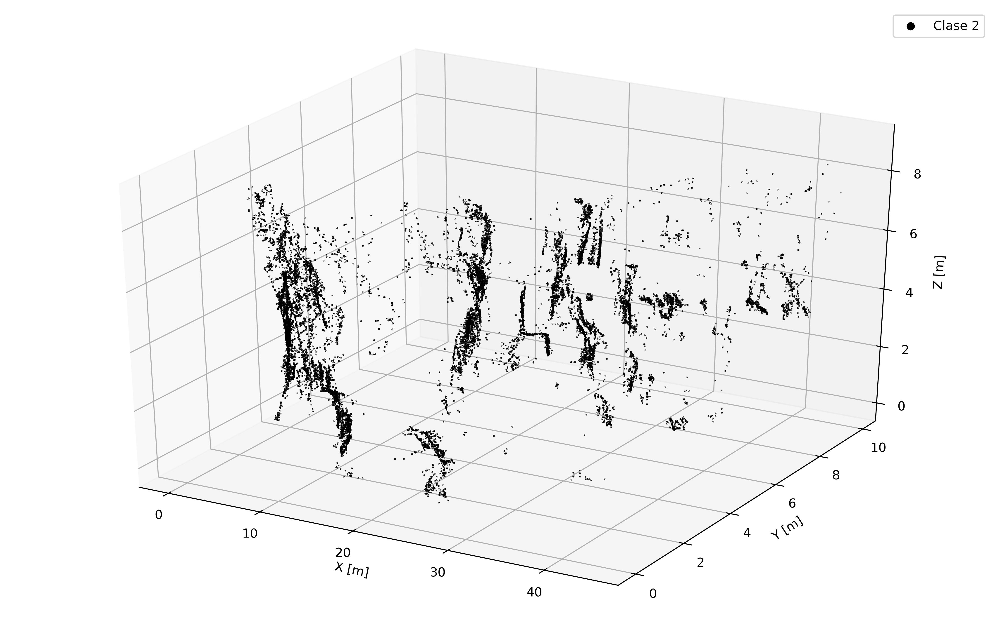

In [6]:
ax = plt.axes(projection='3d')
ax.scatter(xyz[:,0]-np.min(xyz[:,0]),xyz[:,1]-np.min(xyz[:,1]), xyz[:,2]-np.min(xyz[:,2]),'o',c='black', s=0.1, alpha=1)
ax.set_xlabel('X [m]')
ax.set_ylabel('Y [m]')
ax.set_zlabel('Z [m]')
lgnd=ax.legend(['Clase 2'])
for handle in lgnd.legendHandles:
    handle.set_sizes([30.0])
    

## Selección espacial de un subset de datos de la nube

### Recortando una selección de datos usando el eje X

In [7]:
X1=30;
X2=31.5;
min_X=np.min(xyz,axis=0)[0]
spatial_query=xyz[(abs(xyz[:,0]-min_X)>X1) & (abs(xyz[:,0]-min_X)<X2)]
xyz1=spatial_query;

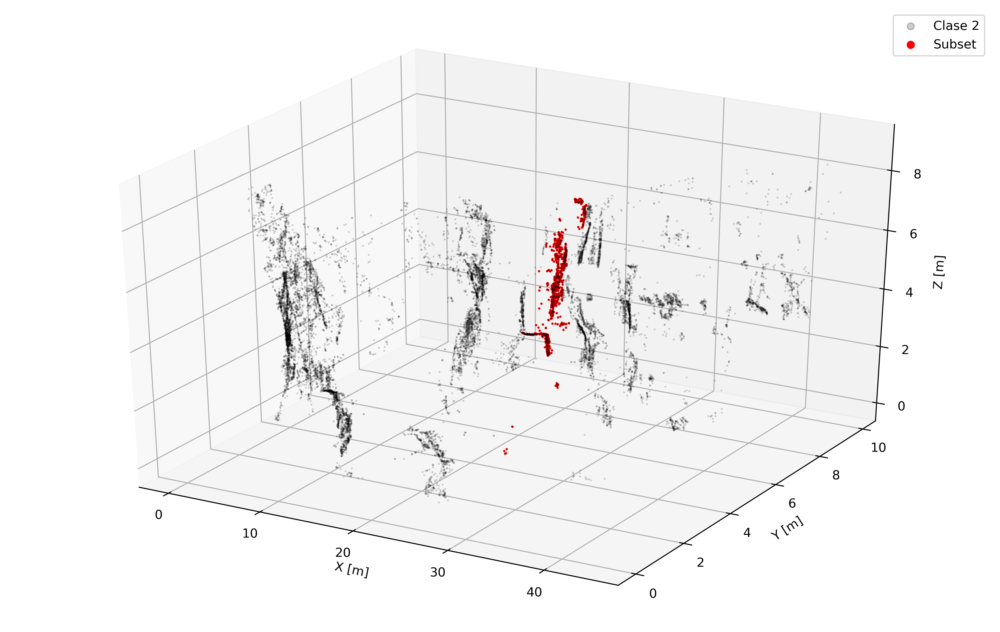

In [8]:
ax = plt.axes(projection='3d')
ax.scatter(xyz[:,0]-np.min(xyz[:,0]),xyz[:,1]-np.min(xyz[:,1]), xyz[:,2]-np.min(xyz[:,2]),'o',c='black', s=0.2, alpha=0.2)
ax.scatter(xyz1[:,0]-np.min(xyz[:,0]),xyz1[:,1]-np.min(xyz[:,1]), xyz1[:,2]-np.min(xyz[:,2]),'.',c='red', s=0.7, alpha=1)

ax.set_xlabel('X [m]')
ax.set_ylabel('Y [m]')
ax.set_zlabel('Z [m]')
lgnd=ax.legend(['Clase 2', 'Subset'])
for handle in lgnd.legendHandles:
    handle.set_sizes([30.0])  

### Acercamiento a los datos en la dirección X

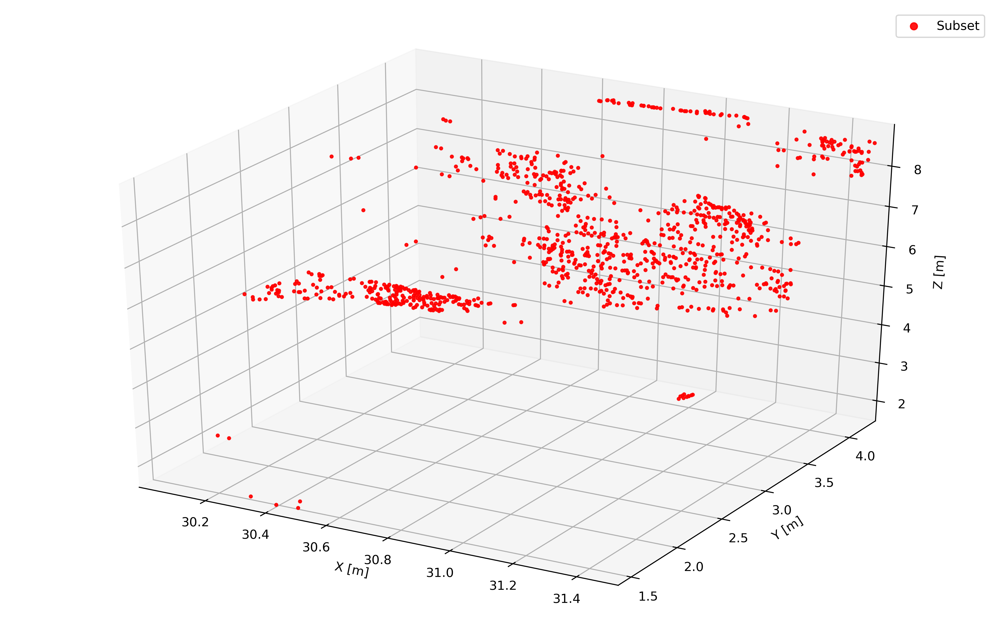

In [9]:
ax = plt.axes(projection='3d')
ax.scatter(xyz1[:,0]-np.min(xyz[:,0]),xyz1[:,1]-np.min(xyz[:,1]), xyz1[:,2]-np.min(xyz[:,2]),'.',c='red', s=5, alpha=0.9)

ax.set_xlabel('X [m]')
ax.set_ylabel('Y [m]')
ax.set_zlabel('Z [m]')
ax.set_xlim([np.min(xyz1[:,0]-np.min(xyz[:,0])) , np.max(xyz1[:,0]-np.min(xyz[:,0]))])
ax.set_ylim([np.min(xyz1[:,1]-np.min(xyz[:,1])) , np.max(xyz1[:,1]-np.min(xyz[:,1]))])
ax.set_zlim([np.min(xyz1[:,2]-np.min(xyz[:,2])) , np.max(xyz1[:,2]-np.min(xyz[:,2]))])
lgnd=ax.legend(['Subset'])
for handle in lgnd.legendHandles:
    handle.set_sizes([30.0])
plt.savefig('class2_subset.png', bbox_inches='tight')

## Calcular el plano que contiene a los puntos de la nube

### Quiasi-Transformada de Hough

La transformada de Hough es un método usado en el campo de la visión de computadora para la detección de curvas. El método se basa en la parametrización de curvas, la formación de curvas de manera aleatoria y el conteo de las que son más populares. En este caso vamos a implementar un método para la detección del plano más común entre tripletas de puntos. Para ello haremos:

1. Selección de un tanto % de los puntos de la clase a estudiar
2. Formación de tríadas (o tripletas) de puntos con combinatoria
3. Cálculo de rumbo y echado del plano formado por cada tripleta usando la regla de la mano derecha
4. Conteo de los planos (en términos de rumbo y echado) que más se repiten 

#### Generando una lista de los índices de xyz1

In [10]:
idx=np.array(list(range(len(xyz1))));
print(len(idx))

1021


#### Seleccionando una muestra del Y% de los índices

In [11]:
#Generamos una máscara de 0s y 1s usando probabilidades
#Vamos a usar X% de False y Y% de True
X=0.98
Y=1-X
np.random.seed(10)
maskp = np.random.choice([False, True], len(idx), p=[X, Y]) 
idx_mskd= idx[maskp]

#### Generando tríadas de puntos usando combinatoria

In [12]:
import itertools
c = list(itertools.combinations(idx_mskd, 3))

In [13]:
print(len(c))

969


In [14]:
print(c[:][0:3])

[(56, 248, 327), (56, 248, 395), (56, 248, 435)]


#### Función que calcula rumbo y echado con regla de la mano derecha a partir de tres puntos en el espacio XYZ

In [15]:
#Funcion para calcular rumbo y echado de un planbo a partir de tres puntos en coordenadas cartesianas.
#La autoría de esta función es de Tyler Pubben
#Disponible para descarga en: https://github.com/tpubben/StructureCalculations/blob/master/strike_dip.py

import math

# The appropriate input for this function is a list of tuples in the format
# [(x1, y1, z1), (x2, y2, z2), (x3, y3, z3)]
def calc_strikedip(pts):
    ptA, ptB, ptC = pts[0], pts[1], pts[2]
    x1, y1, z1 = float(ptA[0]), float(ptA[1]), float(ptA[2])
    x2, y2, z2 = float(ptB[0]), float(ptB[1]), float(ptB[2])
    x3, y3, z3 = float(ptC[0]), float(ptC[1]), float(ptC[2])


    u1 = float(((y1 - y2) * (z3 - z2) - (y3 - y2) * (z1 - z2)))
    u2 = float((-((x1 - x2) * (z3 - z2) - (x3 - x2) * (z1 - z2))))
    u3 = float(((x1 - x2) * (y3 - y2) - (x3 - x2) * (y1 - y2)))

    '''
    Calculate pseudo eastings and northings from origin
    these are actually coordinates of a new point that represents
    the normal from the plane's origin defined as (0,0,0).
    
    If the z value (u3) is above the plane we first reverse the easting
    then we check if the z value (u3) is below the plane, if so
    we reverse the northing. 
    
    This is to satisfy the right hand rule in geology where dip is always
    to the right if looking down strike. 
    '''
    if u3 < 0:
        easting = u2
    else:
        easting = -u2

    if u3 > 0:
        northing = u1
    else:
        northing = -u1
    
    if easting >= 0:
        partA_strike = math.pow(easting, 2) + math.pow(northing, 2)
        strike = math.degrees(math.acos(northing / math.sqrt(partA_strike)))
    else:
        partA_strike = northing / math.sqrt(math.pow(easting, 2) + math.pow(northing, 2))
        strike = math.degrees(2 * math.pi - math.acos(partA_strike))

    # determine dip
#    print(strike, 'strike')
    part1_dip = math.sqrt(math.pow(u2, 2) + math.pow(u1, 2))
    part2_dip = math.sqrt(math.pow(u1,2) + math.pow(u2,2) + math.pow(u3,2))
    dip = math.degrees(math.asin(part1_dip / part2_dip))

    return strike, dip

#### Calculando los rumbos y echados de los planos generados por las tríadas de puntos

In [16]:
strikes=[]
dips=[]
for ii in list(range(len(c))):

    strike, dip=calc_strikedip(list([list(xyz1[c[ii][0],:]), list(xyz1[c[ii][1],:]), list(xyz1[c[ii][2],:])]))
    strikes.append(strike)
    dips.append(dip)

#### Ploteando los rumbos y echados de los planos generados por las tríadas de puntos

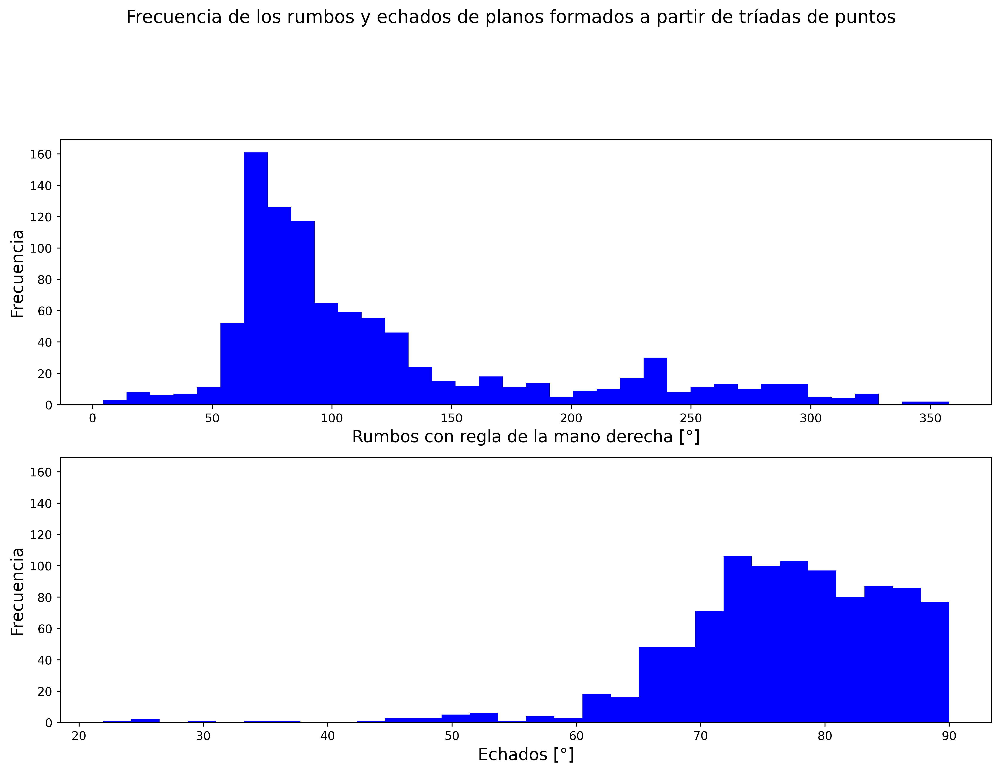

In [17]:
fig, axs = plt.subplots(2, sharex=False, sharey=True)
fig.suptitle('Frecuencia de los rumbos y echados de planos formados a partir de tríadas de puntos',y=1.05, fontsize=15)
axs[0].hist(strikes,bins = 36, color='blue');
axs[0].set_ylabel('Frecuencia',Fontsize=14)
axs[0].set_xlabel('Rumbos con regla de la mano derecha [°]',Fontsize=14)
axs[1].hist(dips,bins = 30, color='blue');
axs[1].set_ylabel('Frecuencia',Fontsize=14)
axs[1].set_xlabel('Echados [°]',Fontsize=14);
#fig.tight_layout()

#### Generando una matriz de conteo

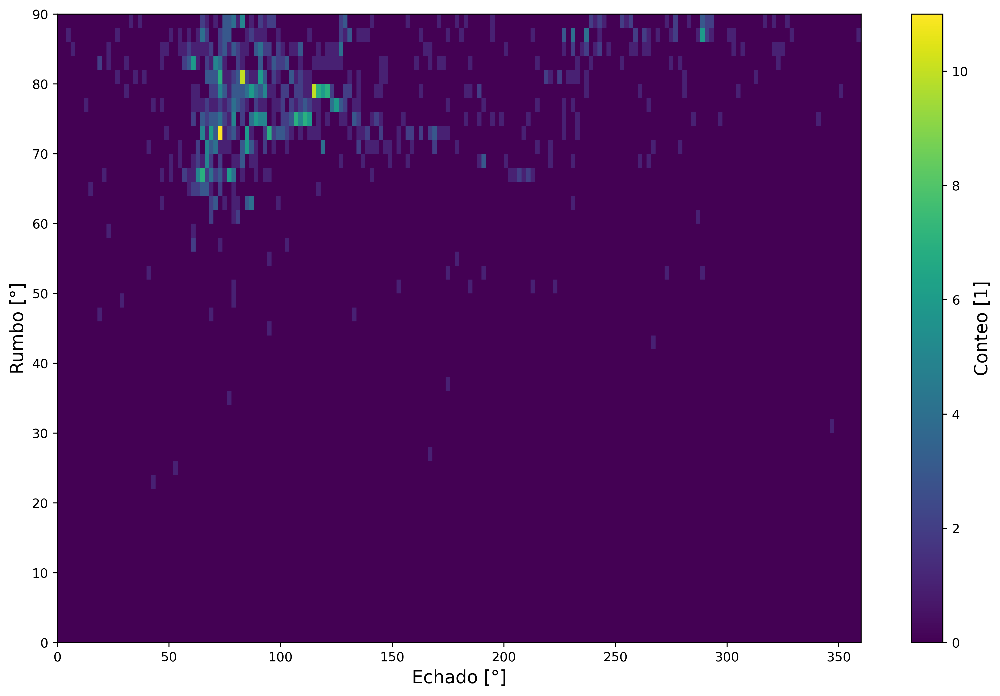

In [18]:
def idx_closest(list, Number):
    aux = []
    for valor in list:
        aux.append(abs(Number-valor))
    return aux.index(min(aux))

#create empty 2d arrays
step_rumbos=2
step_echados=2
rumbos_grid=list(range(0,360+1,step_rumbos))
echados_grid=list(range(0,90+1,step_echados))
RU_EC=np.zeros((len(echados_grid),len(rumbos_grid))) #orden matricial 

for ii in range(len(strikes)):    
    idx_rumbos=idx_closest(rumbos_grid,round(strikes[ii]))
    idx_echados=idx_closest(echados_grid,round(dips[ii]))
    RU_EC[idx_echados,idx_rumbos]=RU_EC[idx_echados,idx_rumbos]+1 #orden matricial 
    

Ri, Ei = np.meshgrid(rumbos_grid, echados_grid) #orden cartesiano
 
# Make the plot
plt.pcolormesh( Ri, Ei, RU_EC)  #orden cartesiano
plt.xlabel('Echado [°]', Fontsize=14);
plt.ylabel('Rumbo [°]', Fontsize=14);
cbar=plt.colorbar();
cbar.set_label('Conteo [1]', Fontsize=14)

In [19]:
maximum = np.max(RU_EC)
index_of_maximum = np.where(RU_EC == maximum)
echado_most_counts=Ei[list(index_of_maximum[0])[0], list(index_of_maximum[1])[0]]+ step_echados/2
rumbo_most_counts=Ri[list(index_of_maximum[0])[0], list(index_of_maximum[1])[0]]+ step_rumbos/2
print("El plano que se puede generar el mayor número de veces con las tripletas de puntos es","Rumbo", rumbo_most_counts,"Echado", echado_most_counts, sep='\n')

El plano que se puede generar el mayor número de veces con las tripletas de puntos es
Rumbo
73.0
Echado
73.0


## Usando mplstereonet para representar los datos en la red estereográfica

### Instalando mplstereonet

In [20]:
#import sys
#sys.path
#!/opt/anaconda3/bin/pip install mplstereonet

In [21]:
import mplstereonet

### Representando los planos en la red estreográfica

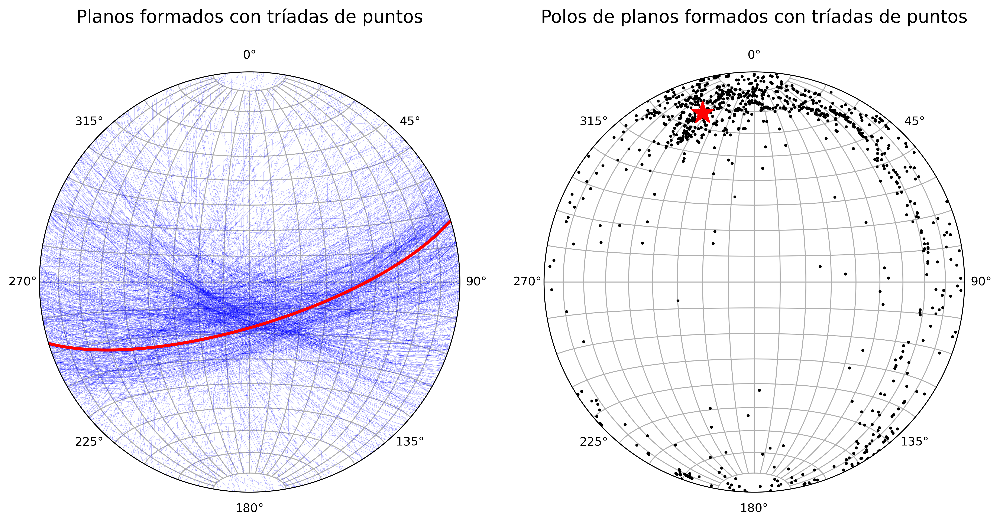

In [22]:
fig = plt.figure()
my_step=1;
ax0 = fig.add_subplot(121, projection='stereonet')
ax0.plane(strikes[1:-1:my_step], dips[1:-1:my_step], c='blue', linewidth=0.05)
ax0.plane(rumbo_most_counts, echado_most_counts, c='r',linewidth=2.5);
ax0.grid(True)
ax0.set_title('Planos formados con tríadas de puntos', y=1.10, fontsize=15)

ax1 = fig.add_subplot(122, projection='stereonet')
ax1.pole(strikes[1:-1:my_step], dips[1:-1:my_step], c='k',Marker = '.', MarkerSize=3)
ax1.pole(rumbo_most_counts, echado_most_counts, c='r', Marker='*', MarkerSize=20);
ax1.grid(True)
ax1.set_title('Polos de planos formados con tríadas de puntos', y=1.10, fontsize=15);

## Encontrando el vector promedio con diferentes métodos de geología estructural

### Mean vector (.find_mean_vector): promedio en estadística esférica

In [23]:
meanv,length=mplstereonet.find_mean_vector(strikes, dips, measurements='poles')
print(meanv)
#Returns the mean vector for a set of measurments. By default, this expects the input to be plunges and bearings, but the type of input can be controlled through the measurement kwarg.

(84.6683979967766, 259.6453169968552)


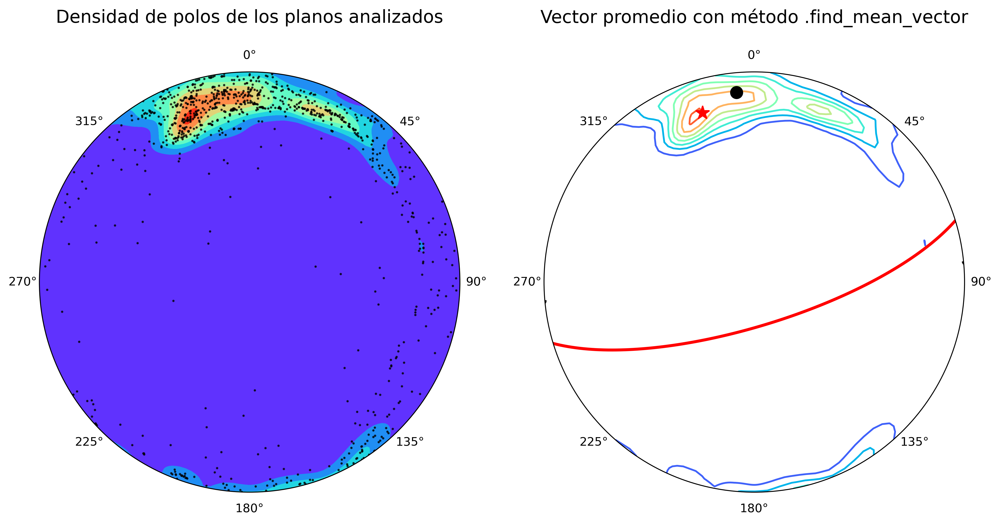

In [24]:
fig = plt.figure()
ax0 = fig.add_subplot(121, projection='stereonet')

ax0.density_contourf(strikes, dips, measurement='poles', cmap='rainbow', gridsize=100)

ax0.pole(strikes, dips, c='k', Marker='.', MarkerSize=2,label='Planes', alpha=0.7)
ax0.set_title('Densidad de polos de los planos analizados', y=1.10, fontsize=15)


ax1 = fig.add_subplot(122, projection='stereonet')

ax1.density_contour(strikes, dips, measurement='poles', cmap='rainbow', gridsize=[50, 50])

ax1.pole(meanv[0], meanv[1], c='k', Marker='.', MarkerSize=20)
ax1.plane(meanv[0], meanv[1], c='k',linewidth=2.5)
ax1.grid(False)
ax1.set_title('Vector promedio con método .find_mean_vector', y=1.10, fontsize=15);

ax1.pole(rumbo_most_counts, echado_most_counts, c='r', Marker='*', MarkerSize=12);
ax1.plane(rumbo_most_counts, echado_most_counts, c='r',linewidth=2.5);

In [25]:
dg=mplstereonet.density_grid(strikes, dips, measurement='poles',gridsize=10)

In [26]:
print(dg[2][9])

[12.74405907 14.0385348   7.32904996  1.12369102  0.85872843  1.21397576
  1.09833625  6.56344117 10.23606171 12.74405907]


### Fit pole (.fit_pole): usando eigenvectores y eigenvalores

In [27]:
centers2=mplstereonet.fit_pole(strikes, dips,measurement='poles')
print(centers2)

#Fits the pole to a plane to a “bullseye” of points on a stereonet.
#The pole to the best-fit plane is extracted by calculating the largest eigenvector of the covariance matrix of the input measurements in cartesian 3D space.

(85.82963515077938, 78.09480187870672)


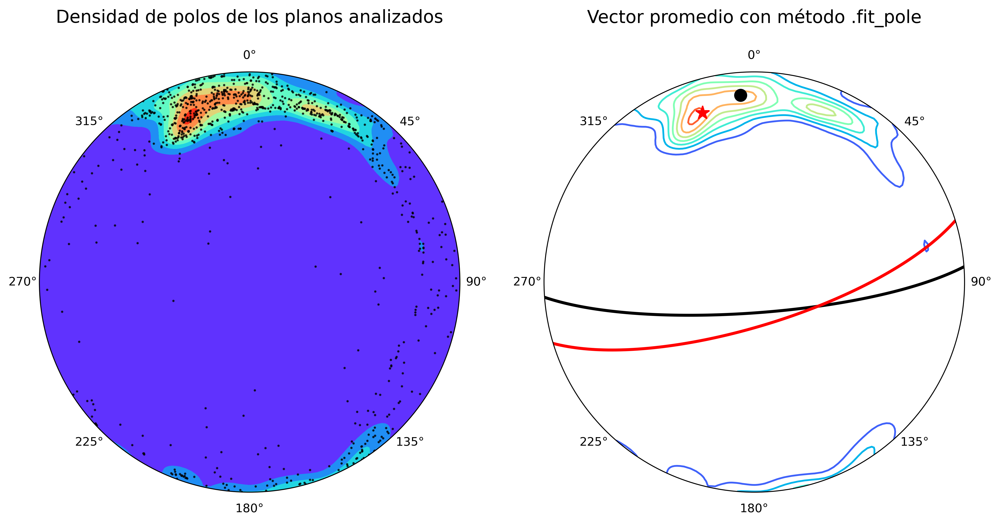

In [28]:
fig = plt.figure()
ax0 = fig.add_subplot(121, projection='stereonet')
ax0.density_contourf(strikes, dips, measurement='poles', cmap='rainbow', gridsize=100)
ax0.pole(strikes, dips, c='k', Marker='.', MarkerSize=2,label='Planes', alpha=0.7)
ax0.set_title('Densidad de polos de los planos analizados', y=1.10, fontsize=15)

ax1 = fig.add_subplot(122, projection='stereonet')

ax1.density_contour(strikes, dips, measurement='poles', cmap='rainbow', gridsize=100)

ax1.pole(centers2[0], centers2[1], c='k', Marker='.', MarkerSize=20)
ax1.plane(centers2[0], centers2[1], c='k',linewidth=2.5)
ax1.grid(False)
ax1.set_title('Vector promedio con método .fit_pole', y=1.10, fontsize=15);

ax1.pole(rumbo_most_counts, echado_most_counts, c='r', Marker='*', MarkerSize=12);
ax1.plane(rumbo_most_counts, echado_most_counts, c='r',linewidth=2.5);

### Fisher stats (.find_fisher_stats): encontrando el promedio según Fisher

In [29]:
confidence=95
vector, stats = mplstereonet.find_fisher_stats(strikes, dips, conf=confidence, measurement='poles')
fmean=mplstereonet.plunge_bearing2pole(vector[0], vector[1])

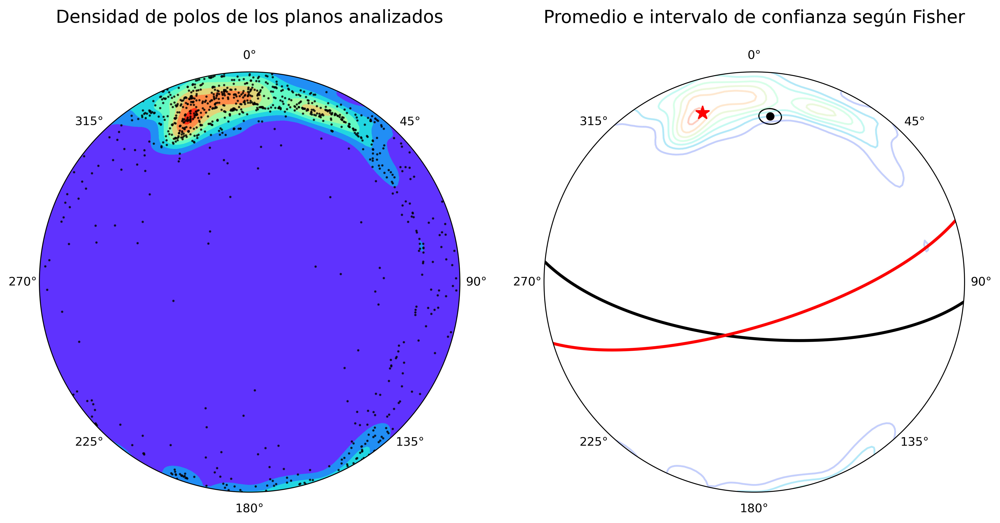

In [30]:
fig = plt.figure()
ax0 = fig.add_subplot(121, projection='stereonet')
ax0.density_contourf(strikes, dips, measurement='poles', cmap='rainbow', gridsize=100)
ax0.pole(strikes, dips, c='k', Marker='.', MarkerSize=2,label='Planes', alpha=0.7)
ax0.set_title('Densidad de polos de los planos analizados', y=1.10, fontsize=15)

ax1 = fig.add_subplot(122, projection='stereonet')
ax1.density_contour(strikes, dips, measurement='poles', cmap='rainbow', gridsize=100, alpha=0.3)

ax1.line(vector[0], vector[1], color="red");
ax1.cone(vector[0], vector[1], stats[1], facecolor="None", edgecolor="k");
ax1.plane(fmean[0], fmean[1], color="black", linewidth=2.5);
ax1.pole(fmean[0], fmean[1], color="black");
ax1.set_title('Promedio e intervalo de confianza según Fisher', y=1.10, fontsize=15);

ax1.pole(rumbo_most_counts, echado_most_counts, c='r', Marker='*', MarkerSize=12);
ax1.plane(rumbo_most_counts, echado_most_counts, c='r',linewidth=2.5);

### K-means (.kmeans)

In [31]:
centers3 = mplstereonet.kmeans(strikes,dips, measurement='poles')
centers3 = mplstereonet.geographic2pole(*zip(*centers3))

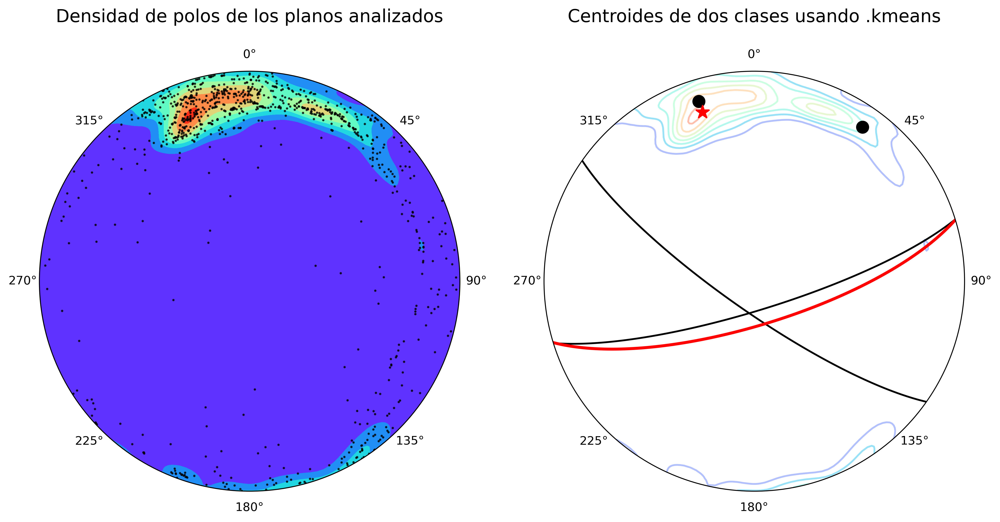

In [32]:
fig = plt.figure()
ax0 = fig.add_subplot(121, projection='stereonet')
ax0.density_contourf(strikes, dips, measurement='poles', cmap='rainbow', gridsize=100)
ax0.pole(strikes, dips, c='k', Marker='.', MarkerSize=2,label='Planes', alpha=0.7)
ax0.set_title('Densidad de polos de los planos analizados', y=1.10, fontsize=15)


ax1 = fig.add_subplot(122, projection='stereonet')
ax1.density_contour(strikes, dips, measurement='poles', cmap='rainbow', gridsize=100, alpha=0.4)

ax1.pole(centers3[0], centers3[1], c='k', Marker='.', MarkerSize=20);
ax1.plane(centers3[0], centers3[1], c='k');
ax1.set_title('Centroides de dos clases usando .kmeans', y=1.10, fontsize=15);

ax1.pole(rumbo_most_counts, echado_most_counts, c='r', Marker='*', MarkerSize=12);
ax1.plane(rumbo_most_counts, echado_most_counts, c='r',linewidth=2.5);
plt.savefig('hough_vs_kmeans.png', bbox_inches='tight')

## Bonus:  Fit girdle (.fit_girdle)

In [33]:
centers1=mplstereonet.fit_girdle(strikes, dips, measurement='poles')
print(centers1)

(296.57126999865886, 13.78233298258921)


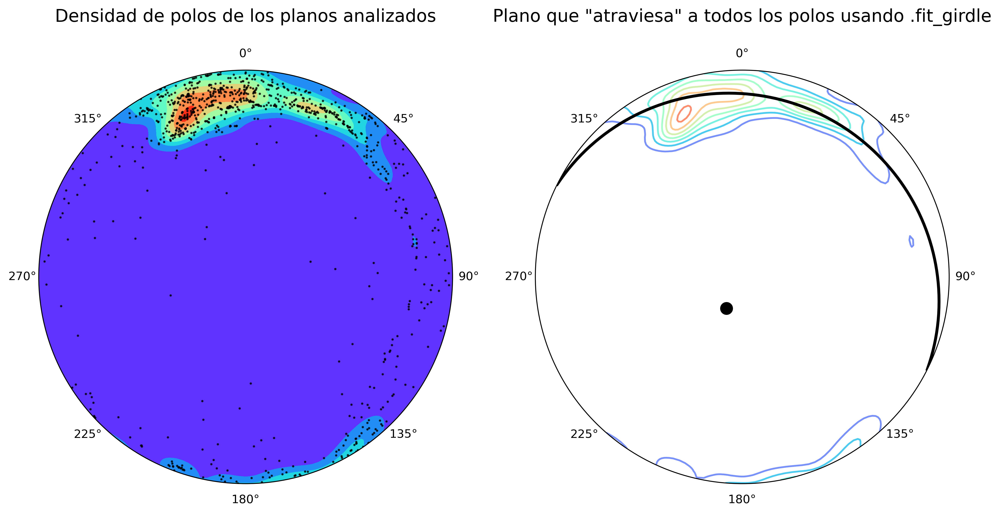

In [34]:
fig = plt.figure()
ax0 = fig.add_subplot(121, projection='stereonet')
ax0.density_contourf(strikes, dips, measurement='poles', cmap='rainbow', gridsize=100)
ax0.pole(strikes, dips, c='k', Marker='.', MarkerSize=2,label='Planes', alpha=0.7)
ax0.set_title('Densidad de polos de los planos analizados', y=1.10, fontsize=15)

ax1 = fig.add_subplot(122, projection='stereonet')

ax1.density_contour(strikes, dips, measurement='poles', cmap='rainbow', gridsize=100, alpha=0.7)

ax1.pole(centers1[0], centers1[1], c='k', Marker='.', MarkerSize=20)
ax1.plane(centers1[0], centers1[1], c='k', linewidth=2.5)
ax1.grid(False)
ax1.set_title('Plano que "atraviesa" a todos los polos usando .fit_girdle', y=1.10, fontsize=15);


### Bonus: Convirtiendo los datos para crear un diagrama de rosa de los rumbos

In [35]:
bin_edges = np.arange(-5, 366, 10)
number_of_strikes, bin_edges = np.histogram(strikes, bin_edges)
number_of_strikes[0] += number_of_strikes[-1]
half = np.sum(np.split(number_of_strikes[:-1], 2), 0)
two_halves = np.concatenate([half, half])

### Comparando histograma vs diagrama de rosas

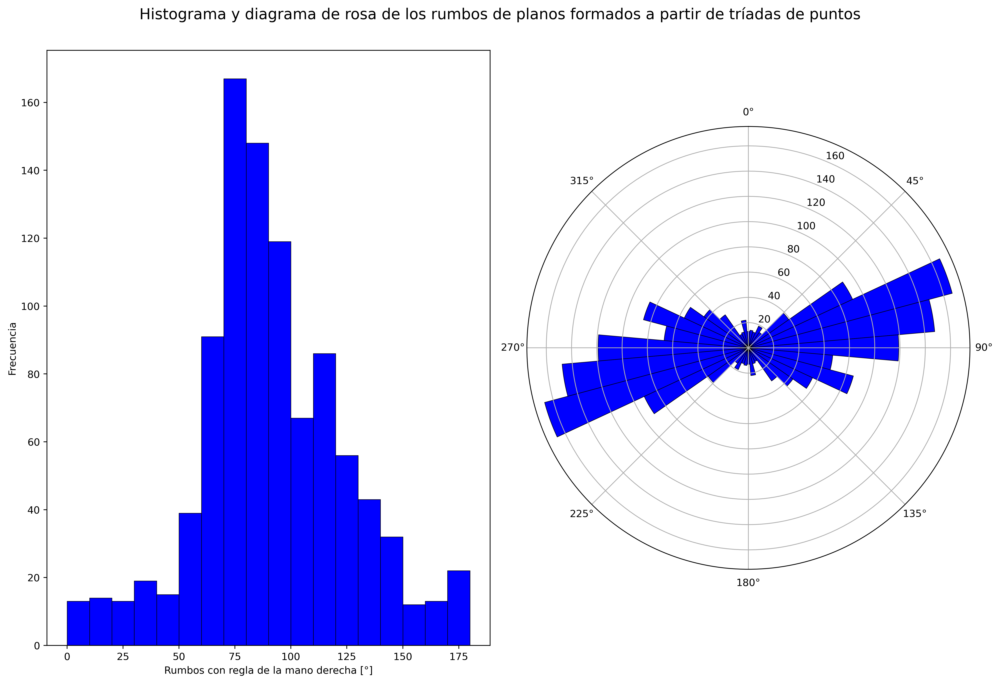

In [36]:
fig = plt.figure()

fig.suptitle('Histograma y diagrama de rosa de los rumbos de planos formados a partir de tríadas de puntos', y=1.05, fontsize=15)
ax0 = fig.add_subplot(121)
ax0.bar(np.arange(0, 180, 10), half, 
       width=10, bottom=0.0, color='blue', edgecolor='k',linewidth=0.5,align='edge')
ax0.set_ylabel('Frecuencia')
ax0.set_xlabel('Rumbos con regla de la mano derecha [°]')

ax1 = fig.add_subplot(122, projection='polar');
ax1.bar(np.deg2rad(np.arange(0, 360, 10)), two_halves, 
       width=np.deg2rad(10), bottom=0.0, color='blue', edgecolor='k',linewidth=0.5);
ax1.set_theta_zero_location('N');
ax1.set_theta_direction(-1);
ax1.grid(True)
fig.tight_layout()

Referencias

Canal de Youtube de Darío: https://www.youtube.com/channel/UCmeMXDwmAyZfmgi3ZiXffYw

1. Pubben, T. (2021). Computationally calculating strike and dip from 3 points – T.J. Scientific. Retrieved 27 March 2021, from http://www.tjscientific.com/2017/08/16/computationally-calculating-strike-and-dip-from-3-points/
2. Kington, J. (2021). mplstereonet Package — mplstereonet 0.6-dev documentation. Retrieved 27 March 2021, from https://mplstereonet.readthedocs.io/en/latest/mplstereonet.html
3. Arellano Gil, J., Llata Romero, R., Carreón Méndez, M., & Morales Barrera, W. (2002). Ejercicios de geología estructural (1st ed.). México, D.F.: Universidad Nacional Autónoma de México, Facultad de Ingeniería, http://www.dict.unam.mx/images/upload/libros/Ejercicios_de_Geologia_Estructural_JAG-SC.pdf
4. Arellano Gil, J., Llata Romero, R., Carreón Méndez, M., & Morales Barrera, W. (2002). Ejercicios de geología estructural (1st ed.). México, D.F.: Universidad Nacional Autónoma de México, Facultad de Ingeniería.